# **Installing Dependencies...!**

In [1]:
!pip install torchsummary

In [2]:
import os
import time
import torch
import torchsummary
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms
from torch.utils.data import Dataset
from torchvision.io import read_image
from torch.utils.data import DataLoader
from torchvision.transforms import Lambda
import torchvision.models as models
import torch.hub
import seaborn as sns
from sklearn.metrics import confusion_matrix

---------
# Creating Helper Functions..!

In [3]:
def create_annotation_file(path):
    
    '''This function returns a csv file, which contains the information about the location of images,size of images and its mapping to a label.
    
        "path": Path to the category folder, which must contain sub-folders for each category of image.
        
        '''
    
    path_to_img_dir=path
    img_folder=[x for x in os.listdir(path_to_img_dir) if 'csv' not in x]
    annotation=pd.DataFrame()

    for i,fold in enumerate(img_folder):
        label_annotation=pd.DataFrame()
        path_to_sub_cat=os.path.join(path_to_img_dir,fold)
        img=[x for x in os.listdir(path_to_sub_cat)]
        img_path=[]

        for im in img:
            img_path.append(os.path.join(path_to_sub_cat,im))


        label=pd.DataFrame({'Path':img_path,
                           'Label':[i]*len(img_path)})

        annotation=pd.concat([annotation,label],axis=0,ignore_index=True)
        
        
    annotation['Size']=annotation['Path'].apply(lambda x:read_image(x).size())
        
    return annotation
    

In [4]:
def drop_inconsistent(annotation):
    ''' This is a helper function, used to remove those images which do not have size same as 3x150x150. It will take a annotation file as 
    input and will drop all those rows where size of image is not equal to desired dimension.'''
    
    j=[]
    for i in range(annotation.shape[0]):
        if sum(annotation.iloc[i]['Size'])!=303:
            j.append(i)
            
    annotation.drop(j,inplace=True)
    
    return annotation

In [5]:
def show_accuracy(data,label=None,overall=None):
    '''This is a helper function which returns calculate the percetage of matching labels and prediction,i.e, accuracy.
    
        "data": A dataframe object having two columns "Actual" & "Pred"
        
         -If label is given, then function returns the accuracy for the given label
         -If Overall is not None, then function returns the accuracy over entire dataset.
         
         '''

    
    if label is not None:
        
        if label in data[data['Actual']==label]['Pred'].value_counts().index:
            tp=data[data['Actual']==label]['Pred'].value_counts().loc[label]
        else:
            tp=0
            
        return tp/data[data['Actual']==label]['Pred'].shape[0]
    
    
    if overall is not None:
        tp=data[data['Actual']==data['Pred']].shape[0]
        return tp/data.shape[0]

In [6]:
def plot_results(model,train_features,train_labels,img_label_map):
    
    """This is a helper function which plots the image alongwith the model predictions. This function is helpful to understand which all categories are getting low scores.
    
        'model': A neural network model.
        'train_features': Input image from train or test set.
        'train_labels': Actual labels of a image.
        'img_label_map': Label to Image category mapping 
        
        
        NOTE: Training is kept off while using this function to check the predicted scores for categories. Use model.train() after using this function to resume the training of model.
        
        """
    
    # set the model in evaluation mode
    model.eval()

    # Assigning images to the placeholder, and converting the shape of image from 3dim to 4dim, as we are using BatchNorm layers in the model !
    x = train_features
    x = x.reshape(-1,3,150,150)

    # turn off gradient calculation
    with torch.no_grad():
        # forward pass through the model
        output = model(x)


    fig,ax= plt.subplots(4,6,figsize=(15,10))
    for i in range(24):

        x= train_features[i]
        x = x.reshape(-1,3,150,150)
        x = x.to('cpu')
        x = x[0]
        x = x

        prob=output[i]
        prob=prob.flatten()[torch.argmax(prob).item()].item()
        pred_label=img_label_map[torch.argmax(output[i]).item()]
        act_label=img_label_map[torch.argmax(train_labels[i]).item()]

        ax[i//6][i%6].imshow(x.permute(1,2,0))
        ax[i//6][i%6].set_title('P({}):{:.3f}'.format(pred_label,prob),fontsize=8)
        ax[i//6][i%6].set_xticks([])
        ax[i//6][i%6].set_yticks([])
        ax[i//6][i%6].set_xlabel(act_label, labelpad=-4)
    #     ax[i//4][i%4].xaxis.labelpad = 20


    plt.show()
    fig.tight_layout()


In [7]:
def convert_from_sparse_to_dense(output,labels):
    
    '''This helper function converts the sparse array, which is returned by our model to a dense array, which contains output label from 0 to 5.
    
        "output": Output array from the model, which is of size  (-1,6).
        "labels": Actual label array for the image, which is of size (-1,6).
        
        - This function will return two list for each, which stores the label for a image (0 to 5). '''
    
        
    output_=torch.zeros(output.size())
    for i in range(output.size()[0]):
        ind=torch.argmax(output[i])
        output_[i]=torch.tensor([0 for j in range(output.size()[1])])
        output_[i][ind]=1


    x_=[torch.argmax(labels[i]).detach().to('cpu').item() for i in range(labels.size()[0])]
    y_=[torch.argmax(output_[i]).detach().to('cpu').item() for i in range(labels.size()[0])]

    return x_,y_

-------------
### Checking the availability of GPU device...!

In [8]:
print("Device Count: ",torch.cuda.device_count())
print("Device Name: ",torch.cuda.get_device_name(0))
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

Device Count:  2
Device Name:  Tesla T4
cuda:0


### Creating annotation files for using DataLoader...! 

In [9]:
test_annotation=create_annotation_file('/kaggle/input/intel-image-classification/seg_test/seg_test')
train_annotation=create_annotation_file('/kaggle/input/intel-image-classification/seg_train/seg_train')
train_annotation=drop_inconsistent(train_annotation)
test_annotation=drop_inconsistent(test_annotation)
test_annotation.to_csv('Test_Image_labels.csv',index=False)
train_annotation.to_csv('Train_Image_labels.csv',index=False)

### Creating image_label mapping for train and test set..

In [10]:

test_img_label_map={}
train_img_label_map={}
for i in range(6):
    test_img_label_map[i]=test_annotation[test_annotation['Label']==i]['Path'].iloc[0].split('/')[-2]
    train_img_label_map[i]=train_annotation[train_annotation['Label']==i]['Path'].iloc[0].split('/')[-2]

In [11]:
print('Test Image_Label Mapping: ',test_img_label_map,sep=' ')
print('Train Image_Label Mapping ',train_img_label_map,sep=' ')

Test Image_Label Mapping:  {0: 'mountain', 1: 'street', 2: 'buildings', 3: 'sea', 4: 'forest', 5: 'glacier'}
Train Image_Label Mapping  {0: 'mountain', 1: 'street', 2: 'buildings', 3: 'sea', 4: 'forest', 5: 'glacier'}


------
## Having a look at sample images of each category..

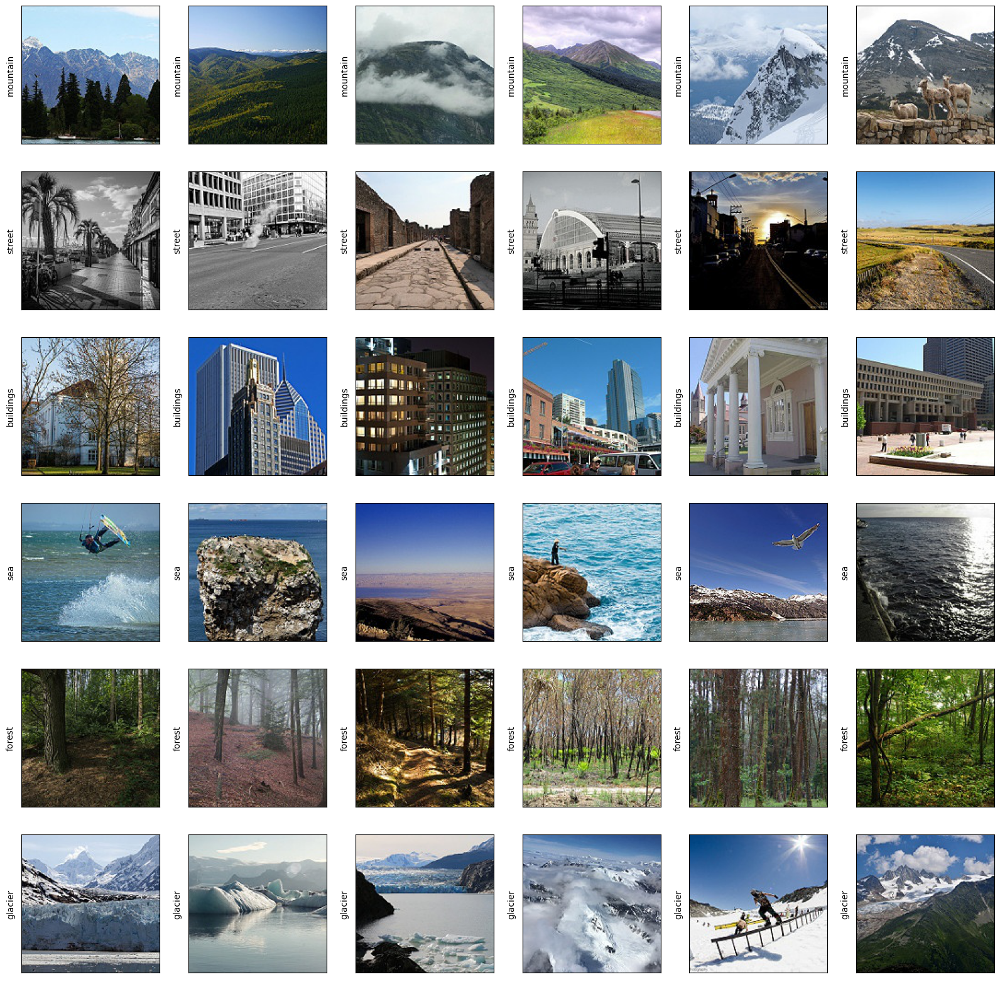

In [12]:
fig,ax = plt.subplots(6,6,figsize=(20,20))

for i in range(36):
    ind=np.random.randint(train_annotation[train_annotation['Label']==i//6].index[0],train_annotation[train_annotation['Label']==i//6].index[-1],6)
    img=plt.imread(train_annotation.iloc[ind[i%6]][0])
    ax[i//6][i%6].imshow(img)
#     if i//6==0:
#         ax[i//6][i%6].set_title("Sample: {}".format(i%6))
 
    ax[i//6][i%6].set_ylabel(train_img_label_map[i//6])
    ax[i//6][i%6].set_xticks([])
    ax[i//6][i%6].set_yticks([])
# plt.tight_layout()
plt.show()

- By looking at the above images, we can notice that few categories could be difficult to classify from each other.
    - **Mountain** and **Glacier** would be bit confusing as glacier images contains mountains in them.
    - Classifying **Street** and **Buildings** could also be a difficult task for a classifier to achieve. As, street images itself contains buildings in them.

------------
## Creating a Custom Data Loader object..

In [13]:
class CustomDataLoader(Dataset):
    
    def __init__(self,annotation_file,img_dir=None,transform=None,target_transform=None):
        
        self.img_dir = img_dir
        self.img_labels = pd.read_csv(annotation_file)
        self.img_transform = transform
        self.target_transform = target_transform
        
    def __len__(self):
        return len(self.img_labels)
    
    def __getitem__(self,idx):
        
        img_path = self.img_labels.iloc[idx,0]
        image = read_image(img_path)
        label = self.img_labels.iloc[idx,1]
        if type(label)==int:
            label=torch.Tensor([label])
        
        if self.img_transform:
            image = self.img_transform(image)
            
        if self.target_transform:
            label = self.target_transform(label)
            
        return image,label

In [14]:
train_dataloader= CustomDataLoader('/kaggle/working/Train_Image_labels.csv',target_transform=None,transform=None)
train_dataloader = DataLoader(train_dataloader,batch_size=train_annotation.shape[0],shuffle=True)

In [15]:
# To normalize the images, we need to pass mean and std. of pixel values of images. Therefore, below is the code to calculate the Mean & Std. of images
data = next(iter(train_dataloader))
mean = torch.mean(data[0].type(torch.float), axis=[0, 2, 3])
std = torch.std(data[0].type(torch.float), axis=[0, 2, 3])
print("Mean: ", mean)
print("Standard Deviation: ", std)

Mean:  tensor([109.6962, 116.6526, 115.7015])
Standard Deviation:  tensor([68.6982, 68.3206, 76.0698])


------
### Defining Transforms
- Converting tensors to float type.
- Resizing images to 150x150.
- Normalizing the pixel values.
- Scaling the pixel values to the range of 0 to 1.

In [16]:
target_transform = Lambda(lambda y: torch.zeros(6, dtype=torch.float).scatter_(dim=0, index=torch.tensor(y), value=1))
transform = transforms.Compose([
    transforms.Lambda(lambda x: x.type(torch.float32)),
    transforms.Resize(150),
    transforms.Normalize(mean=mean, std=std),
    transforms.Lambda(lambda x:(x-torch.min(x))/(torch.max(x)-torch.min(x)))
    
])

### Visualising the Images after applying Transforms & To check if the CustomDataLoader is able to pull images correctly..

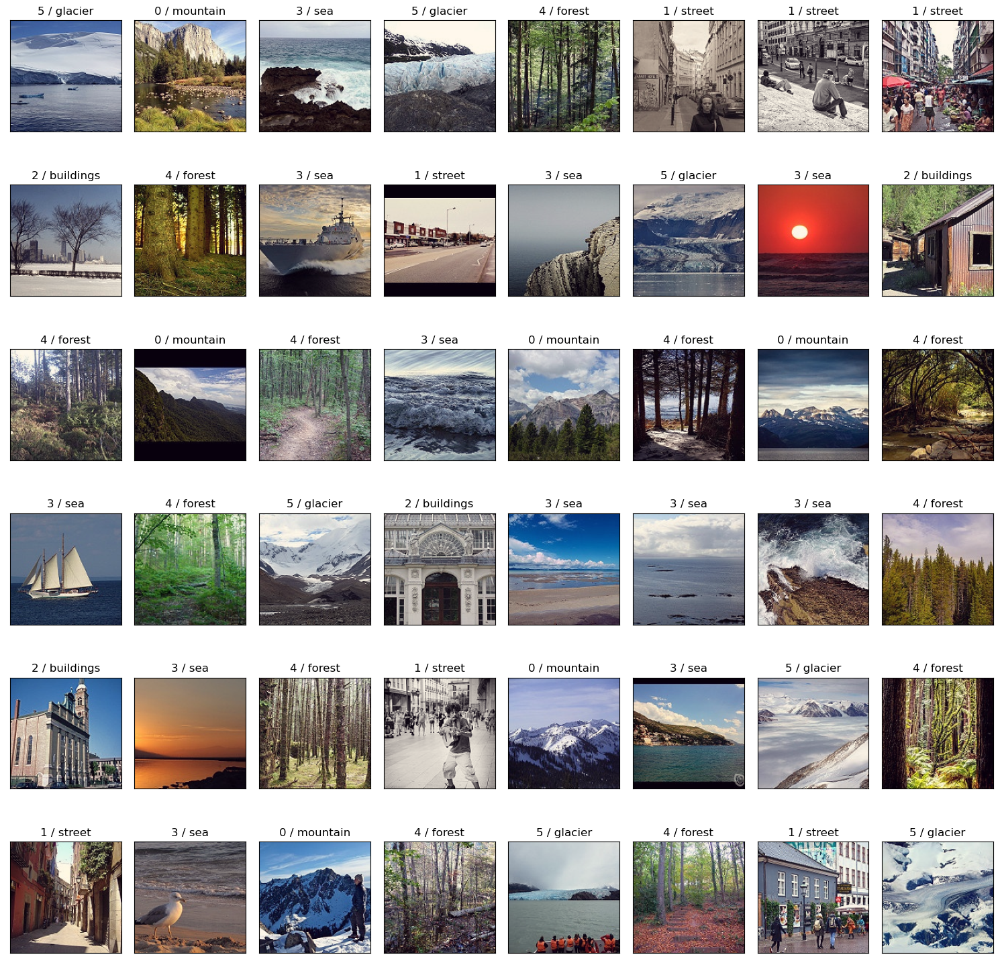

In [17]:
train_dataloader= CustomDataLoader('/kaggle/working/Train_Image_labels.csv',target_transform=target_transform,transform=transform)
train_dataloader = DataLoader(train_dataloader,batch_size=48,shuffle=True)
train_features, train_labels = next(iter(train_dataloader))

# Display image and label.
fig,ax = plt.subplots(6,8,figsize=(15,15))
for i in range(48):
    img = train_features[i].squeeze()
    label = torch.argmax(train_labels[i])
    ax[i//8][i%8].imshow(img.permute(1,2,0), cmap="gray")
    ax[i//8][i%8].set_title(f"{label} / {train_img_label_map[int(label.item())]}")
    ax[i//8][i%8].set_xticks([])
    ax[i//8][i%8].set_yticks([])

fig.tight_layout()
plt.show()

-----------
## Defining our CNN model
- Architecture Description:
    - Size of feature map grows from 3 -> 32x1 -> 32x2 ->32x4....32x32.
    - 6, Convolution Layers
    - 5, 2dBatchNorm Layers (except for the 1st layer)
    - 5x5, Kernel Size
    - Strdide size is 1
    - ReLU Activation
    - Avg. Pooling (2x2)
    - Top layers consists of 3 Linear layers and 1 output layer having Softmax as activation function.
    - All the Linear layers have ReLU as activation function.
    - 1d BatchNorm for all Linear layers.

In [18]:
class MulticlassNet(nn.Module):
    
    def __init__(self):
        super().__init__()

        self.conv1 = nn.Conv2d(nc, nf, kernel_size=5,bias=False)

        self.conv2 = nn.Conv2d(nf,nf*2, kernel_size=5,bias=False)
        self.batch_norm2 = nn.BatchNorm2d(nf*2)
        
        self.conv3 = nn.Conv2d(nf*2,nf*2*2, kernel_size=5,bias=False)
        self.batch_norm3 = nn.BatchNorm2d(nf*2*2)
        
        self.conv4 =  nn.Conv2d(nf*2*2,nf*2*2*2, kernel_size=5,bias=False)
        self.batch_norm4 = nn.BatchNorm2d(nf*2*2*2)
        
        self.conv5 =  nn.Conv2d(nf*2*2*2,nf*2*2*2*2, kernel_size=5,bias=False)
        self.batch_norm5 = nn.BatchNorm2d(nf*2*2*2*2)
        
        self.conv6 =  nn.Conv2d(nf*2*2*2*2,nf*2*2*2*2*2, kernel_size=5,bias=False)
        self.batch_norm6 = nn.BatchNorm2d(nf*2*2*2*2*2)
        
        self.fc1 = nn.Linear(512*5*5,512,bias=False)
        self.batch_norm7 = nn.BatchNorm1d(512)
        
        self.fc2 = nn.Linear(512,256,bias=False)
        self.batch_norm8 = nn.BatchNorm1d(256)
        
        self.fc3 = nn.Linear(256,32,bias=False)
        self.batch_norm9 = nn.BatchNorm1d(32)
        
        self.fc4 = nn.Linear(32,6,bias=False)
        self.batch_norm10 = nn.BatchNorm1d(6)
        
        self.softmax = nn.Softmax(dim=1)
        
        self.dropout= nn.Dropout(0.3)

  
    def forward(self, x):
        

        x = F.relu(self.conv1(x),inplace=True)
        
        x = F.avg_pool2d(F.relu(self.conv2(x),inplace=True),2)
        x = self.batch_norm2(x)
        
        x = F.avg_pool2d(F.relu(self.conv3(x),inplace=True),2)
        x = self.batch_norm3(x)
        
        x = F.avg_pool2d(F.relu(self.conv4(x),inplace=True),2)
        x = self.batch_norm4(x)
        
        x = F.avg_pool2d(F.relu(self.conv5(x),inplace=True),2)
        x = self.batch_norm5(x)
        
        x = x.view(-1,512*5*5)
        
        
        x = self.dropout(F.relu(self.fc1(x)))
        x = self.batch_norm7(x)
        
        x = self.dropout(F.relu(self.fc2(x)))
        x = self.batch_norm8(x)
        
        x =self.dropout(F.relu(self.fc3(x)))
        x = self.batch_norm9(x)
        
        x = self.fc4(x)
        x = self.batch_norm10(x)
        x = self.softmax(x)
        
        return x

In [19]:
nc=3
nf=32
model=MulticlassNet()

In [20]:
model=MulticlassNet().to(device)
torchsummary.summary(model,(3,150,150))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 146, 146]           2,400
            Conv2d-2         [-1, 64, 142, 142]          51,200
       BatchNorm2d-3           [-1, 64, 71, 71]             128
            Conv2d-4          [-1, 128, 67, 67]         204,800
       BatchNorm2d-5          [-1, 128, 33, 33]             256
            Conv2d-6          [-1, 256, 29, 29]         819,200
       BatchNorm2d-7          [-1, 256, 14, 14]             512
            Conv2d-8          [-1, 512, 10, 10]       3,276,800
       BatchNorm2d-9            [-1, 512, 5, 5]           1,024
           Linear-10                  [-1, 512]       6,553,600
          Dropout-11                  [-1, 512]               0
      BatchNorm1d-12                  [-1, 512]           1,024
           Linear-13                  [-1, 256]         131,072
          Dropout-14                  [

-----
### Checking if our Model is able to output scores for different categories

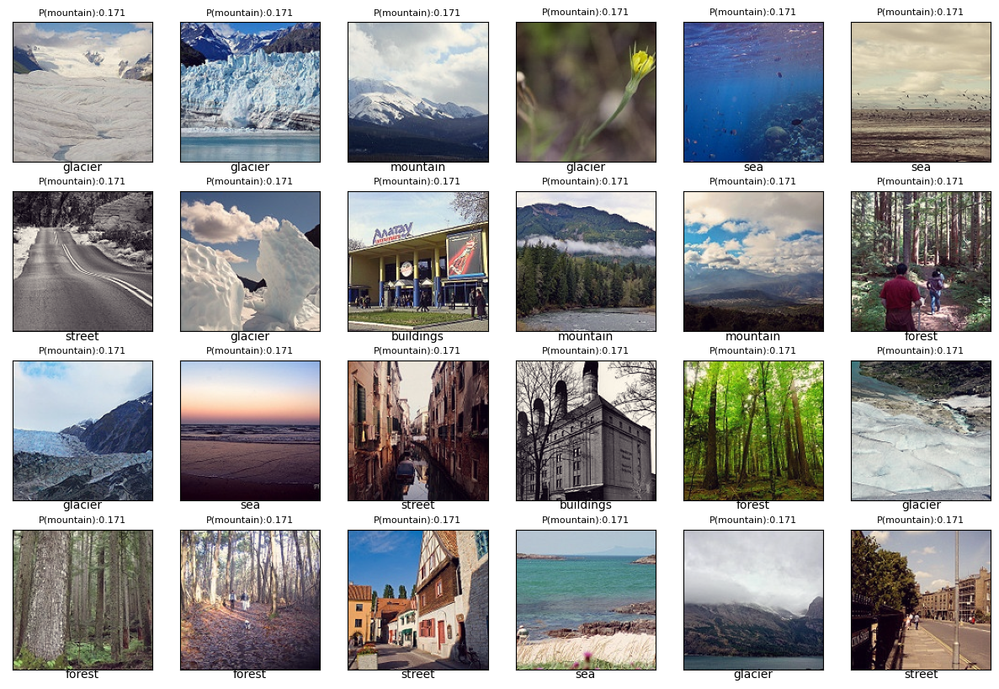

In [21]:
fixed_train_features, fixed_train_labels = next(iter(train_dataloader))
plot_results(model,fixed_train_features.to(device),fixed_train_labels,train_img_label_map)

----------
## Defining Learning Rate & Loss Metric for our Neural Network
- I'll be using Adam Optimizer coupled with Learning Rate Scheduler.
    - Initially Adam Optimizer has learning rate of 0.02
    - Scheduler will decrease the learning rate by 50% after every 3 epochs.

In [22]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.02)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=654, gamma=0.5)

criterion = nn.CrossEntropyLoss()

------
## Defining a Training & Evaluation Loop 

In [23]:
# Setting Loop parameters
n_epochs=30
n_batch_size=64
steps=int(train_annotation.shape[0]/n_batch_size)
training_loss=[]
testing_loss=[]


# Instantiating Data Loader objects, for Training and Test dataset..!
train_dataloader= CustomDataLoader('/kaggle/working/Train_Image_labels.csv',target_transform=target_transform,transform=transform)
train_dataloader = DataLoader(train_dataloader,batch_size=n_batch_size,shuffle=True)

##### Batch size in testing data loader object is kept equal to the size of testing set..!
test_dataloader= CustomDataLoader('/kaggle/working/Test_Image_labels.csv',target_transform=target_transform,transform=transform)
test_dataloader = DataLoader(test_dataloader,batch_size=500,shuffle=True)



# Inititalising the model training..!
model.train()

for epoch in range(n_epochs):
    start= time.time()
    
    # These variables will store the actuals labels (X) and predicted labels (Y) after each iteration, this well help us to calculate the accuracy score of our classifier..!
    train_X_=[]
    train_Y_=[]
    
    test_X_=[]
    test_Y_=[]
    
    for step in range(steps):
        
################Training Block###########################        
        
        train_features, train_labels = next(iter(train_dataloader))
        train_features = train_features.to(device)
        train_labels = train_labels.type(torch.float).to(device)
        
        
        optimizer.zero_grad()
        
        train_output = model(train_features)
        train_loss = criterion(train_output,train_labels)
        training_loss.append(train_loss.item())
        train_loss.backward()

        optimizer.step()

        

################Prediction Block###########################        
        
        test_features, test_labels = next(iter(test_dataloader))
        test_features = test_features.to(device)
        test_labels = test_labels.type(torch.float).to(device)
        

        model.eval()
        
        with torch.no_grad():
            
            test_output = model(test_features)
            test_loss = criterion(test_output,test_labels)
            testing_loss.append(test_loss.item())
            
        
        model.train()

        
################Preparing the labels to compare###########################

        train_x_,train_y_ = convert_from_sparse_to_dense(train_output,train_labels)
        train_X_.extend(train_x_)
        train_Y_.extend(train_y_)
        
        
        test_x_,test_y_ = convert_from_sparse_to_dense(test_output,test_labels)
        test_X_=test_x_
        test_Y_=test_y_
################Printing the Error metrics and Score###########################      
        
        if step%50==0:
            train_classification_output=pd.DataFrame({"Actual":train_X_,"Pred":train_Y_})
            test_classification_output=pd.DataFrame({"Actual":test_X_,"Pred":test_Y_})
            
            print("Epoch {}/{} | Step {}/{}, TrainingLoss: {:4f}, TestingLoss: {:4f},Overall Train Accuracy: {:.4f}, Overall Test Accuracy: {:.4f}".format(epoch,n_epochs,int(step/50),int(steps/50),train_loss.detach(),test_loss.detach(),show_accuracy(train_classification_output,overall=True),show_accuracy(test_classification_output,overall=True)))
            
    
    
    for i in range(6):
        print("Train & Test Accuracy for {} class is {:.2f} & {:.2f}".format(train_img_label_map[i],show_accuracy(train_classification_output,label=i),show_accuracy(test_classification_output,label=i)))
    print("Time for current epoch: {:.2f}".format(time.time()-start))
    print("-"*50)


Epoch 0/30 | Step 0/4, TrainingLoss: 1.793262, TestingLoss: 1.909592,Overall Train Accuracy: 0.1875, Overall Test Accuracy: 0.1340
Epoch 0/30 | Step 1/4, TrainingLoss: 1.503140, TestingLoss: 1.899268,Overall Train Accuracy: 0.4216, Overall Test Accuracy: 0.1420
Epoch 0/30 | Step 2/4, TrainingLoss: 1.576376, TestingLoss: 1.598970,Overall Train Accuracy: 0.4623, Overall Test Accuracy: 0.4380
Epoch 0/30 | Step 3/4, TrainingLoss: 1.472658, TestingLoss: 1.681666,Overall Train Accuracy: 0.4804, Overall Test Accuracy: 0.3480
Epoch 0/30 | Step 4/4, TrainingLoss: 1.419655, TestingLoss: 1.721296,Overall Train Accuracy: 0.4967, Overall Test Accuracy: 0.3020
Train & Test Accuracy for mountain class is 0.60 & 0.29
Train & Test Accuracy for street class is 0.60 & 0.91
Train & Test Accuracy for buildings class is 0.26 & 0.07
Train & Test Accuracy for sea class is 0.09 & 0.07
Train & Test Accuracy for forest class is 0.78 & 0.44
Train & Test Accuracy for glacier class is 0.62 & 0.06
Time for current e

-------
## Evaluation and Loss Metric Visualisation

In [30]:
# Calculating average loss per epoch for training and testing set..!
ma_tr=[]
ma_te=[]
for i in range(30):
    ma_tr.append(sum(training_loss[30*i:30*(i+1)])/30)
    ma_te.append(sum(testing_loss[30*i:30*(i+1)])/30)

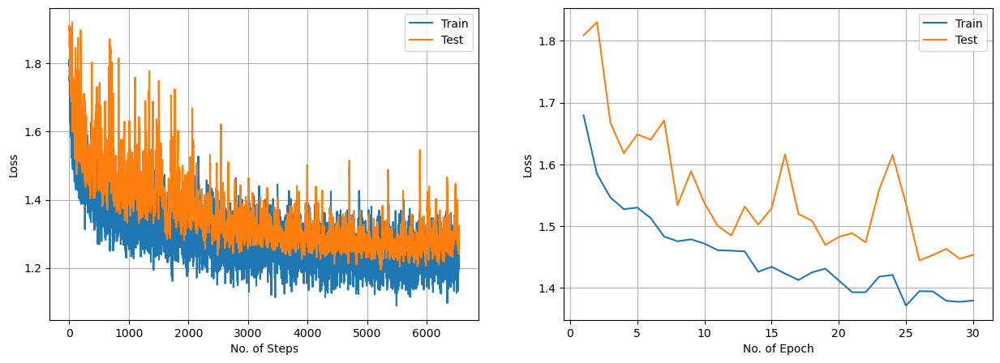

In [35]:
# Displaying the Loss curve for training, epoch wise and iteration wise..
fig,ax= plt.subplots(1,2,figsize=(15,5))

ax[0].plot([i for i in range(len(training_loss))],training_loss)
ax[0].plot([i for i in range(len(testing_loss))],testing_loss)
ax[0].legend(['Train','Test'])
ax[0].set_xlabel('No. of Steps')
ax[0].set_ylabel('Loss')
ax[0].grid(True)

ax[1].plot([i for i in range(1,31)],ma_tr)
ax[1].plot([i for i in range(1,31)],ma_te)
ax[1].legend(['Train','Test'])
ax[1].set_xlabel('No. of Epoch')
ax[1].set_ylabel('Loss')
ax[1].grid(True)

plt.show()

- We can see that our model is able to converge after slight training.
- As our model is performing almost similarly for both sets, we can assume our model to be good fit model.

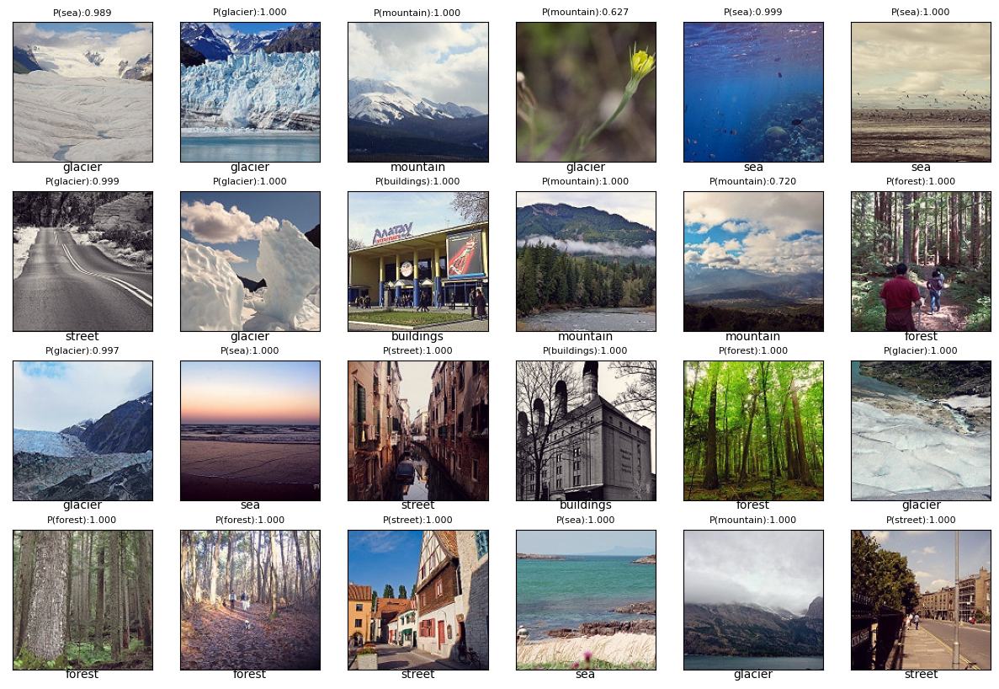

In [36]:
# Comparing the prediction on fixed set of images, before training and after training ...!
plot_results(model,fixed_train_features.type(torch.float).to(device),fixed_train_labels,train_img_label_map)

- We can compare that previously, our model was randomly assigning the score to above images. After training it is able to assign score intelligently..!

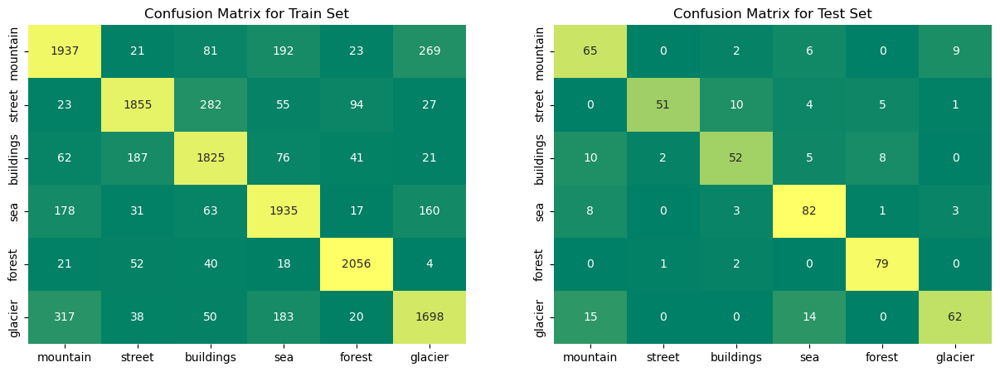

In [37]:
# Visualising the Confusion Matrix, It'll help us to know for which categories our classifer is getting confused...!

fig,ax= plt.subplots(1,2,figsize=(15,5))
sns.heatmap(confusion_matrix(train_X_,train_Y_),annot=True,cmap='summer',cbar=False, fmt='g',xticklabels=[train_img_label_map[i] for i in range(len(train_img_label_map))],
           yticklabels=[train_img_label_map[i] for i in range(len(train_img_label_map))],ax=ax[0])
sns.heatmap(confusion_matrix(test_X_,test_Y_),annot=True,cmap='summer',cbar=False, fmt='g',xticklabels=[test_img_label_map[i] for i in range(len(test_img_label_map))],
           yticklabels=[test_img_label_map[i] for i in range(len(test_img_label_map))],ax=ax[1])

ax[0].set_title('Confusion Matrix for Train Set')
ax[1].set_title('Confusion Matrix for Test Set')
plt.show()


- From the above matrix, we can see that in both training and testing matrix, our classifier is getting little confused between:
    - Mountain, Sea & Glacier.
        - It may be because they share more similar features with each other. We can see in some of Glacier images majority of portion is comprised of mountains and sea. It is only snow/ice which helps us to identify glacier as glacier.
    - Street, Buildings & Forest.
        - This could be also because of having similar features with each other. We can clearly see in some of Street images majority portion is comprised of buildings. Same goes for street and forest. In some of the forest images, majority portion consists of street.
        

- Possible Solutions:
    - A better feature extractor can be used instead of above model.
    - Perform exhausitve EDA and:
        - We can manually drop those images, which seems to be confusing or which contains majority portion as feature of other class.
        - We can manually assign high label value to the confusing images.

In [28]:
# torch.save(model.state_dict(),'MutliclassModel_v3.wt')